In [ ]:
### Load in the data 

In [1]:
import pandas as pd
training_data = pd.read_parquet('training.parquet')
training_data.sample(10)

,Category,Text
18160,misc.forsale,I have the following items for sale.\n\nRabbit...
5950,comp.os.ms-windows.misc,"\nOn a recently acquired Gateway 2000 machine,..."
336,talk.politics.mideast,In article <1483500350@igc.apc.org> Center for...
13175,comp.sys.ibm.pc.hardware,"Well, my 14inch VGA 1024x758-interlacing 2.5 y..."
349,talk.politics.mideast,If you think that kind of uncalled for blanket...
11367,comp.windows.x,"In article <9304292140.AA29951@haji.haji_sun>,..."
4637,rec.sport.baseball,scottm@helena.stat.uga.edu (scott mclure) writ...
19052,talk.religion.misc,In article <20APR199301460499@utarlg.uta.edu> ...
7072,sci.crypt,In article <1993Apr28.104036.15896@ens.fr>\n\t...
3047,alt.atheism,cmtan@iss.nus.sg (Tan Chade Meng - dan) writes...


We want to transform each of the messages into a numeric vector. One way to do this would be to associate a space in a bit vector with every possible word. We could set each bit to `True` or `1` if the corresponding word appears in that message, and `0` or `False` otherwise. In practice this is not practical because of the huge memory requirements. Instead we use a 'hashing vectoriser' which _hashes_ the words to vectors of a fixed, finite number of bits. 

You can see that many of the messages contain non-standard words or character strings such as email addresses. It is common practice to ignore such words during the feature engineering stage. We do this by setting a 'token_pattern' parameter to ensure that only standard words are hashed. 

We also want to remove any 'stop words' from the text. We do this by setting `stop_words='english'`.


In [3]:
from sklearn.feature_extraction.text import HashingVectorizer
BUCKETS=2048

hv = HashingVectorizer(norm=None, token_pattern='(?u)\\b[A-Za-z]\\w+\\b', stop_words ='english', n_features=BUCKETS, alternate_sign = False)
hv
hvcounts = hv.fit_transform(training_data["Text"])
hvcounts

<13947x2048 sparse matrix of type '<class 'numpy.float64'>'
	with 1236563 stored elements in Compressed Sparse Row format>

Let's use term frequency-inverse document frequency, or tf-idf, to generate feature vectors. Tf-idf is commonly used to summarise text data, and it aims to capture how important different words are within a set of documents. Tf-idf combines a normalized word count (or term frequency) with the inverse document frequency (or a measure of how common a word is across all documents) in order to identify words, or terms, which are 'interesting' within the document, with respect to the set of documents. 

In [4]:
from sklearn.feature_extraction.text import TfidfTransformer

tfidf_transformer = TfidfTransformer()
hvdf_tfidf = tfidf_transformer.fit_transform(hvcounts)
hvdf_tfidf

<13947x2048 sparse matrix of type '<class 'numpy.float64'>'
	with 1236563 stored elements in Compressed Sparse Row format>

### Visualise

In [5]:
import sklearn.decomposition

DIMENSIONS = 2

pca2 = sklearn.decomposition.TruncatedSVD(DIMENSIONS)
pca_a = pca2.fit_transform(hvdf_tfidf)

In [6]:
pca_df = pd.DataFrame(pca_a, columns=["x", "y"])
pca_df.sample(10)

,x,y
3287,0.215201,-0.025285
1812,0.149762,0.014522
4561,0.171733,-0.016091
1636,0.144782,0.020173
13170,0.170439,0.071234
9163,0.085042,0.009016
13063,0.264976,-0.046213
13744,0.250745,0.052708
1952,0.244468,0.014736
5838,0.262501,-0.040816


In [7]:
plot_data = pd.concat([training_data.reset_index(), pca_df], axis=1)

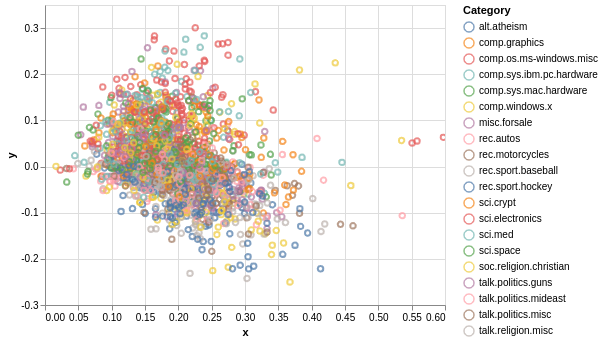

In [8]:
import altair as alt

alt.renderers.enable('notebook')
alt.Chart(plot_data.sample(2000)).encode(x="x", y="y", color="Category").mark_point().interactive()

In [9]:
#No structure. Why?

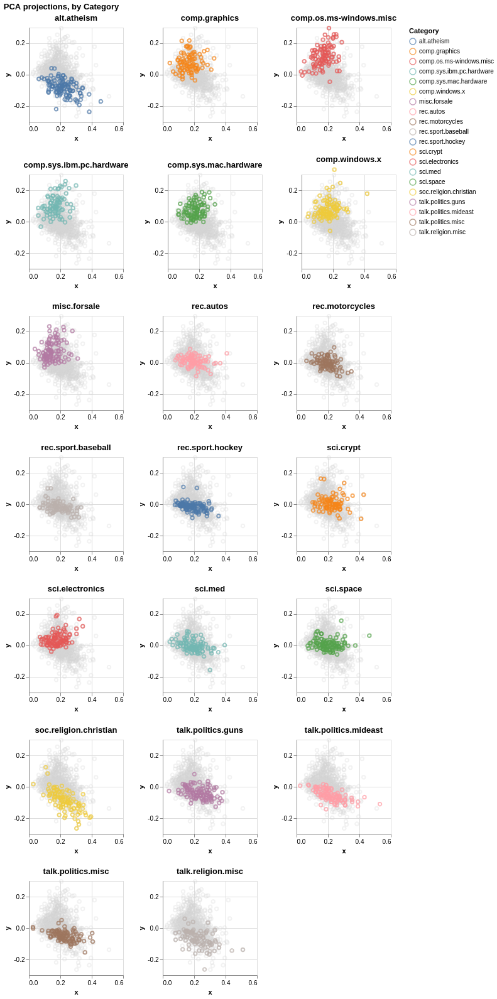

In [10]:
import altair as alt
from altair.expr import datum

data=plot_data.sample(2000)

base = alt.Chart(data).mark_point().encode(
    alt.X('x', scale=alt.Scale(domain=(0, 0.6))),
    alt.Y('y', scale = alt.Scale(domain = (-0.3, 0.3))),
    color='Category:N'
)

## Make gray points for background
chart1 = alt.Chart(data.sample(1000)) \
            .encode(x="x", y="y") \
            .mark_point(opacity=0.3, color="lightgray")


def overlay_make_chart(base_chart, category, options, chart1):
    title = category
    chart2 = base_chart\
      .transform_filter(datum.Category == category)\
      .properties(width=options['width'], 
                    height=options['height'], title=title)
    chart = chart1 + chart2
    return chart


options = {'width': 150, 'height': 150}
charts = [overlay_make_chart(base, category, options, chart1) \
          for category in sorted(data.Category.unique())]

# make a single row
def make_chart_row(row_of_charts):
    hconcat = [chart for chart in row_of_charts]
    row = alt.HConcatChart(hconcat=hconcat)
    return row

# take an array of charts and produce a facet grid
def facet_wrap(charts, charts_per_row):
    rows_of_charts = [
        charts[i:i+charts_per_row] 
        for i in range(0, len(charts), charts_per_row)]        
    vconcat = [make_chart_row(r) for r in rows_of_charts]    
    vcc = alt.VConcatChart(vconcat=vconcat)\
      .configure_axisX(grid=True)\
      .configure_axisY(grid=True)
    return vcc

# assemble the facet grid
compound_chart = facet_wrap(charts, charts_per_row=3)
compound_chart.properties(title='PCA projections, by Category')

In [11]:
##okay good - looks better. 

In [12]:
from sklearn.pipeline import Pipeline 

BUCKETS=2048
hv = HashingVectorizer(norm=None, token_pattern='(?u)\\b[A-Za-z]\\w+\\b', stop_words ='english', n_features=BUCKETS, alternate_sign = False)
tfidf = TfidfTransformer()
feat_pipeline = Pipeline([('vect',hv), ('tfidf',tfidf)])

In [13]:
training_vecs = feat_pipeline.fit_transform(training_data["Text"])

In [15]:
from xgboost import XGBClassifier

In [16]:
%%time

XGB_TREE_METHOD='hist'
xgb = XGBClassifier(tree_method=XGB_TREE_METHOD, 
                    # num_parallel_tree=16, 
                    n_estimators=100, 
                    max_depth=3, 
                    colsample_bynode=0.3, 
                    colsample_bytree=0.3, 
                    subsample=1, 
                    reg_alpha=1)

xgb.fit(training_vecs, training_data["Category"])

CPU times: user 32min 39s, sys: 4.45 s, total: 32min 43s
Wall time: 1min 31s


XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=0.3, colsample_bytree=0.3, gamma=0, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.300000012, max_delta_step=0, max_depth=3,
              min_child_weight=1, missing=nan, monotone_constraints='()',
              n_estimators=100, n_jobs=0, num_parallel_tree=1,
              objective='multi:softprob', random_state=0, reg_alpha=1,
              reg_lambda=1, scale_pos_weight=None, subsample=1,
              tree_method='hist', validate_parameters=1, verbosity=None)

In [17]:
xgb.score(training_vecs, training_data["Category"])

0.8820534882053488

In [18]:
testing_data = pd.read_parquet('testing.parquet')
testing_vecs=feat_pipeline.transform(testing_data["Text"])
xgb.score(testing_vecs, testing_data["Category"])

0.7204283085159779

In [19]:
from mlworkflows import plot

df, chart =plot.confusion_matrix(testing_data["Category"], xgb.predict(testing_vecs))

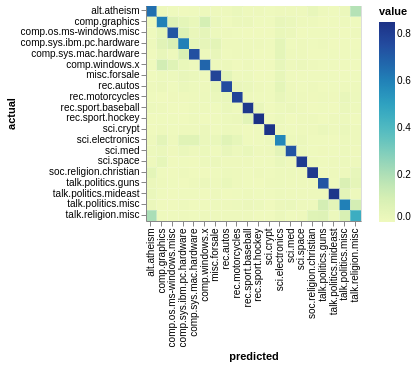

In [20]:
chart

In [21]:
from sklearn.metrics import classification_report
print(classification_report(testing_data["Category"], xgb.predict(testing_vecs)))

                          precision    recall  f1-score   support

             alt.atheism       0.62      0.65      0.63       284
           comp.graphics       0.59      0.60      0.60       303
 comp.os.ms-windows.misc       0.71      0.72      0.72       293
comp.sys.ibm.pc.hardware       0.60      0.60      0.60       303
   comp.sys.mac.hardware       0.73      0.74      0.74       286
          comp.windows.x       0.65      0.68      0.66       280
            misc.forsale       0.74      0.78      0.76       305
               rec.autos       0.70      0.76      0.73       300
         rec.motorcycles       0.79      0.78      0.78       317
      rec.sport.baseball       0.78      0.82      0.80       291
        rec.sport.hockey       0.90      0.85      0.87       310
               sci.crypt       0.94      0.84      0.89       303
         sci.electronics       0.52      0.58      0.55       274
                 sci.med       0.80      0.73      0.76       314
         

In [23]:
from mlworkflows import util

util.serialize_to(xgb, "model.sav")